In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import re ##regular expression, to find or replace particular phrases or words
import string ##get some information from string, preprocessing using string module
import nltk #natural language processing tool kit, 
import warnings
%matplotlib inline

warnings.filterwarnings('ignore')


import string
from nltk import pos_tag
from nltk.corpus import wordnet
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
nltk.download('averaged_perceptron_tagger')

import plotly.express as px
import plotly.graph_objs as go

In [2]:
df = pd.read_csv('train_tweet.csv')

In [3]:
df.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [4]:
## data type info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31962 entries, 0 to 31961
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      31962 non-null  int64 
 1   label   31962 non-null  int64 
 2   tweet   31962 non-null  object
dtypes: int64(2), object(1)
memory usage: 749.2+ KB


#### there are two int type variable and one object variable which we are going to treat it as string. There are no null values as well so we don't need to remove any values.


In [5]:
### preprocessing step 1: going to remove twitter handles (@user). for that we are definning a function.

def remove_pattern(input_txt, pattern): #it will remove the patter from the text.
    r = re.findall(pattern, input_txt) ##it will find all the patterns in the input text.
    for word in r:
        input_txt = re.sub(word, "" , input_txt)
    return input_txt
        

In [6]:
## remove twitter handles i.e., @user things

##creating a new variable clean tweet which contains the tweet without the @user term.
#np.vectorize is used to apply that function to all the rows in the dataset
# @[\w]* is a regular expression term where [\w] represents a word

df['clean_tweet'] = np.vectorize(remove_pattern)(df['tweet'], "@[\w]*")

In [7]:
df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when a father is dysfunctional and is so sel...
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks for #lyft credit i can't use cause th...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation,factsguide: society now #motivation


In [8]:
## toremove special characters numbers and punctuations
df['clean_tweet'] = df['clean_tweet'].str.replace("[^a-zA-Z#]", " ")

##this replace function replaces other than a-z and # in the given text

In [9]:
##removing shorter words i.e words that one or two charcter
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: " ".join([w for w in x.split() if len(w)>3]))
df.head()


##here we are using a lamda function where we first split every word and if the len of the word is greater than 3 
##    it will be added to the new string

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when father dysfunctional selfish drags kids i...
1,2,0,@user @user thanks for #lyft credit i can't us...,thanks #lyft credit cause they offer wheelchai...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model love take with time
4,5,0,factsguide: society now #motivation,factsguide society #motivation


In [10]:
## now we need to tokenize the tweet. that is we need to split the tweet into individual words which are tokens.
## this will be done for all the natural language processing task

tokenized_tweet = df['clean_tweet'].apply(lambda x: x.split())
tokenized_tweet.head()

##here we have splitted the string so that it will be easy for processing

0    [when, father, dysfunctional, selfish, drags, ...
1    [thanks, #lyft, credit, cause, they, offer, wh...
2                              [bihday, your, majesty]
3                     [#model, love, take, with, time]
4                   [factsguide, society, #motivation]
Name: clean_tweet, dtype: object

In [11]:
## stem the words this is also another nlp preprocessing step
## stemmimg is the process of narrowing down to a single common word. 
## for example if you words like fighting fighter fight it will turn everything into one common word fight


from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()

tokenized_tweet = tokenized_tweet.apply(lambda sentence: [stemmer.stem(word) for word in sentence])
tokenized_tweet

0        [when, father, dysfunct, selfish, drag, kid, i...
1        [thank, #lyft, credit, caus, they, offer, whee...
2                                  [bihday, your, majesti]
3                         [#model, love, take, with, time]
4                             [factsguid, societi, #motiv]
                               ...                        
31957                                        [that, youuu]
31958    [nina, turner, airwav, tri, wrap, herself, man...
31959                   [listen, song, monday, morn, work]
31960    [#sikh, #templ, vandalis, #calgari, #wso, cond...
31961                                      [thank, follow]
Name: clean_tweet, Length: 31962, dtype: object

In [12]:
##combining all the words together
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = " ".join(tokenized_tweet[i])

df['clean_tweet'] = tokenized_tweet
df.head()

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when father dysfunct selfish drag kid into dys...
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit caus they offer wheelchair ...
2,3,0,bihday your majesty,bihday your majesti
3,4,0,#model i love u take with u all the time in ...,#model love take with time
4,5,0,factsguide: society now #motivation,factsguid societi #motiv


#### EDA

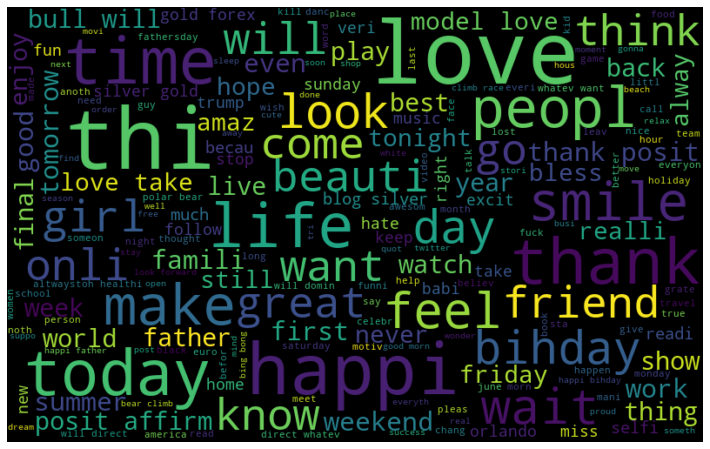

In [13]:
##displaying the frequent words

all_words = " ".join([sentence for sentence in df['clean_tweet']]) ##combines all the sentence into one sentence


from wordcloud import WordCloud
wordcloud = WordCloud(width = 800, height = 500, random_state = 42, max_font_size = 100).generate(all_words)


##plot the figure
plt.figure(figsize = (15,8))
plt.imshow(wordcloud , interpolation = 'bilinear')
plt.axis('off')
plt.show()

##the words that are bigger are frequently occuring words

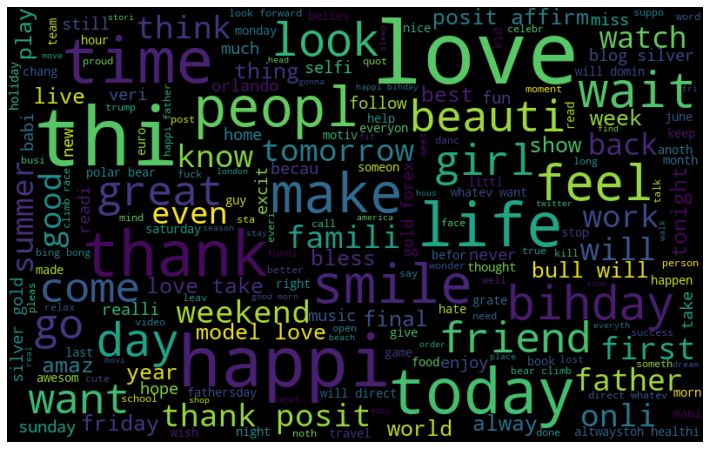

In [14]:
## displaying frequent positive words
all_words = " ".join([sentence for sentence in df['clean_tweet'][df['label'] == 0]]) ##combines all the sentence into one sentence


from wordcloud import WordCloud
wordcloud = WordCloud(width = 800, height = 500, random_state = 42, max_font_size = 100).generate(all_words)


##plot the figure
plt.figure(figsize = (15,8))
plt.imshow(wordcloud , interpolation = 'bilinear')
plt.axis('off')
plt.show()

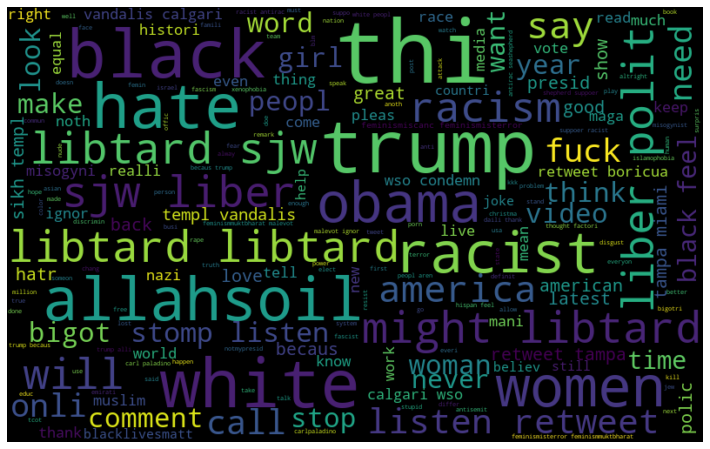

In [15]:
## displaying frequent negative words
all_words = " ".join([sentence for sentence in df['clean_tweet'][df['label'] == 1]]) ##combines all the sentence into one sentence


from wordcloud import WordCloud
wordcloud = WordCloud(width = 800, height = 500, random_state = 42, max_font_size = 100).generate(all_words)


##plot the figure
plt.figure(figsize = (15,8))
plt.imshow(wordcloud , interpolation = 'bilinear')
plt.axis('off')
plt.show()

In [16]:
### function to extract hashtag from the tweet. based on hashtag we can say what the tweet is about
def hashtag_extract(tweets):
    hashtags = []
    ##loop word in tweet
    for tweet in tweets:
        ht = re.findall(r"#(\w+)", tweet) ##using regulat expression to find the pattern in the tweet
        hashtags.append(ht)
    return hashtags


In [17]:
## extract hashtags for both positive and negative tweets
ht_positive = hashtag_extract(df['clean_tweet'][df['label'] == 0])

ht_negative = hashtag_extract(df['clean_tweet'][df['label'] == 1])

In [18]:
ht_positive[:10]

##if there is no hastag the list will be empty

[['run'],
 ['lyft', 'disapoint', 'getthank'],
 [],
 ['model'],
 ['motiv'],
 ['allshowandnogo'],
 [],
 ['school', 'exam', 'hate', 'imagin', 'actorslif', 'revolutionschool', 'girl'],
 ['allin', 'cav', 'champion', 'cleveland', 'clevelandcavali'],
 []]

In [19]:
## now we need to combine all the hastags into one list

ht_positive = sum(ht_positive,[])
ht_negative = sum(ht_negative,[])

In [20]:
ht_positive[:10]
## now they are combined into single list this will make the process easier.

['run',
 'lyft',
 'disapoint',
 'getthank',
 'model',
 'motiv',
 'allshowandnogo',
 'school',
 'exam',
 'hate']

In [21]:
## using dictionary from nltk to process the tweets
freq = nltk.FreqDist(ht_positive)

#we are converting it into a dataframe
d = pd.DataFrame({'Hashtag': list(freq.keys()), 'Count': list(freq.values())})
d.head()

,Hashtag,Count
0,run,72
1,lyft,2
2,disapoint,1
3,getthank,2
4,model,375


In [22]:
freq

FreqDist({'love': 1654, 'posit': 917, 'smile': 676, 'healthi': 573, 'thank': 534, 'fun': 463, 'life': 425, 'affirm': 423, 'summer': 390, 'model': 375, ...})

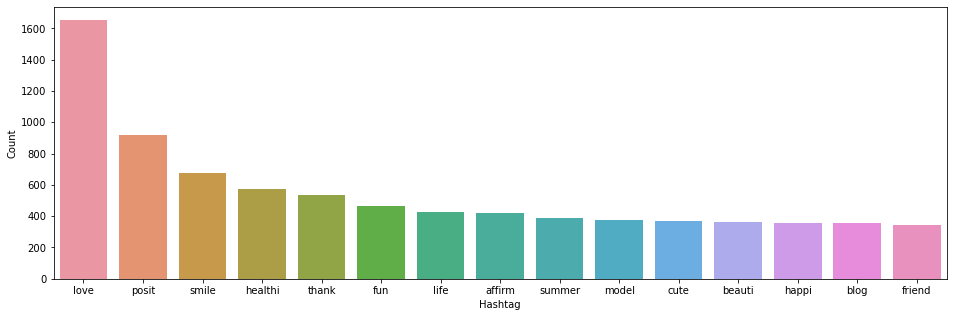

In [23]:
##top 10 positive hashtags 
d = d.nlargest(columns="Count", n = 15)  ##here n is the number of items to be shown in the graph
plt.figure(figsize=(16,5))
sns.barplot(data=d, x= "Hashtag", y = "Count")
plt.show()

In [24]:
## using dictionary from nltk to process the tweets
freq = nltk.FreqDist(ht_negative)

#we are converting it into a dataframe
d = pd.DataFrame({'Hashtag': list(freq.keys()), 'Count': list(freq.values())})
d.head()

,Hashtag,Count
0,cnn,10
1,michigan,2
2,tcot,14
3,australia,6
4,opkillingbay,5


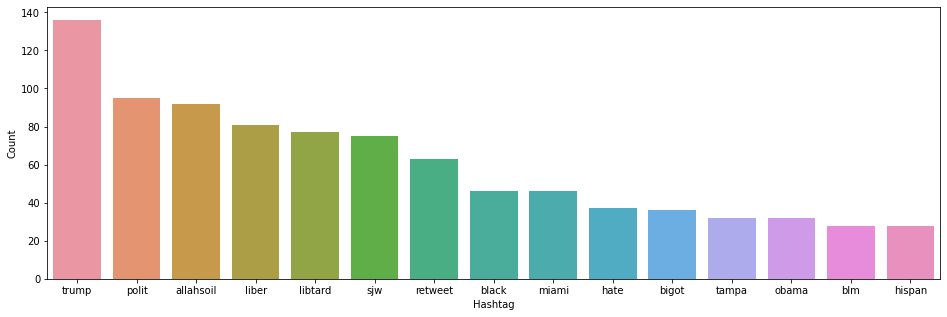

In [25]:
##top 10negative hashtags
d = d.nlargest(columns="Count", n = 15)  ##here n is the number of items to be shown in the graph
plt.figure(figsize=(16,5))
sns.barplot(data=d, x= "Hashtag", y = "Count")
plt.show()

In [26]:
## fearture selection
## we need to convert this list of strings into bag of words which is a basic preprocessing in NLP

from sklearn.feature_extraction.text import CountVectorizer

## count vectorizer will create bag of words

#bag of words = matrix of words and with it's occurances
bow_vectorizer = CountVectorizer(max_df = 0.90, min_df = 2, max_features = 1000, stop_words = 'english')

##max_features means number o
# features to be considered, if it is not mentioned means it will take all the feature which will more time for trainning

## stop words is mentioned based on the language of the dataset and it will remove all stop words
bow = bow_vectorizer.fit_transform(df['clean_tweet'])

In [27]:
bow

<31962x1000 sparse matrix of type '<class 'numpy.int64'>'
	with 124813 stored elements in Compressed Sparse Row format>

In [28]:
bow[0].toarray()

##there are few 1's in some places which represent the features in that tweet

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 

In [29]:
## spilitting the data for trainning

from sklearn.model_selection import train_test_split
x_train , x_test, y_train, y_test = train_test_split(bow, df['label'] , random_state = 42, test_size = 0.25)

In [35]:
df.head(2)

,id,label,tweet,clean_tweet
0,1,0,@user when a father is dysfunctional and is s...,when father dysfunct selfish drag kid into dys...
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit caus they offer wheelchair ...


In [39]:
sid = SentimentIntensityAnalyzer()
df['sentiment']= df['clean_tweet'].apply(lambda x: sid.polarity_scores(x))
df = pd.concat([df.drop(['sentiment'], axis=1), df['sentiment'].apply(pd.Series)], axis=1)
df = df.rename(columns={'neu': 'neutral', 'neg': 'negative', 'pos': 'positive'})

# add sentiment based on max score
df['confidence'] = df[["negative", "neutral", "positive"]].max(axis=1)
df['sentiment'] = df[["negative", "neutral", "positive"]].idxmax(axis=1)

In [40]:
df

,id,label,tweet,clean_tweet,negative,neutral,positive,compound,confidence,sentiment
0,1,0,@user when a father is dysfunctional and is s...,when father dysfunct selfish drag kid into dys...,0.417,0.583,0.000,-0.6124,0.583,neutral
1,2,0,@user @user thanks for #lyft credit i can't us...,thank #lyft credit caus they offer wheelchair ...,0.000,0.611,0.389,0.6249,0.611,neutral
2,3,0,bihday your majesty,bihday your majesti,0.000,1.000,0.000,0.0000,1.000,neutral
3,4,0,#model i love u take with u all the time in ...,#model love take with time,0.000,0.488,0.512,0.6369,0.512,positive
4,5,0,factsguide: society now #motivation,factsguid societi #motiv,0.000,1.000,0.000,0.0000,1.000,neutral
...,...,...,...,...,...,...,...,...,...,...
31957,31958,0,ate @user isz that youuu?ðððððð...,that youuu,0.000,1.000,0.000,0.0000,1.000,neutral
31958,31959,0,to see nina turner on the airwaves trying to...,nina turner airwav tri wrap herself mantl genu...,0.000,0.663,0.337,0.7269,0.663,neutral
31959,31960,0,listening to sad songs on a monday morning otw...,listen song monday morn work,0.000,1.000,0.000,0.0000,1.000,neutral
31960,31961,1,"@user #sikh #temple vandalised in in #calgary,...",#sikh #templ vandalis #calgari #wso condemn,0.342,0.658,0.000,-0.3818,0.658,neutral


In [41]:
# create data for plot
grouped = pd.DataFrame(df['sentiment'].value_counts()).reset_index()
grouped.columns = ['sentiment', 'count']

# Display percentage of positive, negative and neutral sentiments
fig = px.pie(grouped, values='count', names='sentiment', title='Sentiments')
fig.show()

In [42]:
sentiment_ratio = df['sentiment'].value_counts(normalize=True).to_dict()
for key in ['negative', 'neutral', 'positive']:
    if key not in sentiment_ratio:
        sentiment_ratio[key] = 0.0

## Display sentiment score
sentiment_score = (sentiment_ratio['neutral'] + sentiment_ratio['positive']) - sentiment_ratio['negative']

fig = go.Figure(go.Indicator(
    mode = "number+delta",
    value = sentiment_score,
    delta = {"reference": 0.5},
    title = {"text": "Sentiment Score"},))

fig.show()

In [44]:
fig = px.scatter(df, y='sentiment', color='sentiment', size='confidence', hover_data=['clean_tweet'], color_discrete_map={"negative":"firebrick","neutral":"navajowhite","positive":"darkgreen"})


fig.update_layout(
    width=800,
    height=300,
)